# Segmentation multi-classes avec un UNet 

In [1]:
import os
import numpy as np  
import pandas as pd
import torch
import torchvision
from glob import glob
import torch.nn as nn
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torchvision.utils import make_grid
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

### Chargement des données 

/home/souna/Bureau/Master/master1/S2/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: /home/souna/.cache/kagglehub/datasets/dansbecker/cityscapes-image-pairs/versions/1


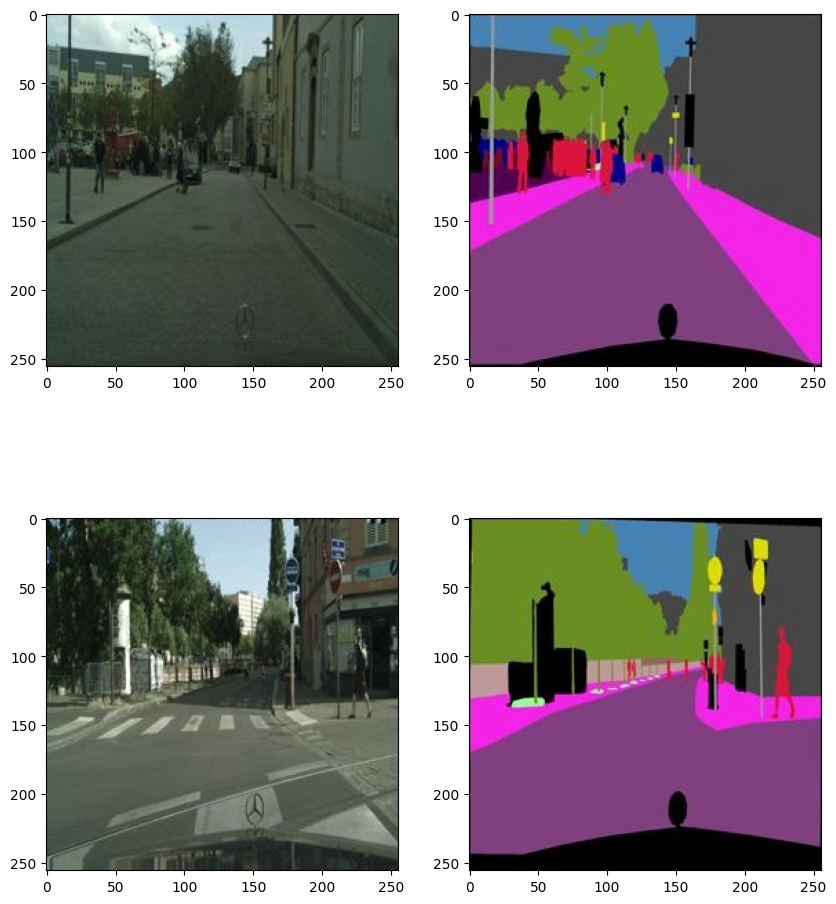

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("dansbecker/cityscapes-image-pairs")
print("Path to dataset files:", path)

train_path = glob(f'{path}/cityscapes_data/cityscapes_data/train/*')
valid_path = glob(f'{path}/cityscapes_data/cityscapes_data/val/*')

nb = 2
fig,ax = plt.subplots(nb,2,figsize=(10,nb*6))
for i in range(nb):
    img = plt.imread(train_path[i])
    ax[i][0].imshow(img[:,:256])
    ax[i][1].imshow(img[:,256:])

In [3]:
torch.manual_seed(42) # Set seed for PyTorch
np.random.seed(42) # Set seed for NumPy

# Training parameters
BATCH_SIZE = 16
LEARNING_RATE = 0.01
WEIGHT_DECAY = 0.01
USE_SCHEDULER = True
EPOCHS = 50  # 50

### => Répondre sur le "Template_TP4"

### Questions Théoriques

- Définir le principe de la segmentation. 

- Expliquer le rôle de l'encoder et du décodeur de l'architecture Unet.

- Quels sont les facteurs qui peuvent rendre difficile la segmentation multi-classe ? (3 facteurs minimum)

### Questions CODE
- Lors du resize des images et des masques quelles sont les techniques d'interpolations utilisées et pourquoi diffèrent-elles ? 

- Dans UNET.py, que signifie **nn.BatchNorm2d(output_channel)**  ? 

- Expliquer la ligne de code  **scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)**

### Questions pratiques 

- Pourquoi le premier masque généré est uniforme ? 

- Suivre les 3 expériences : 

**Expérience 1**
NEW_SIZE =  (80,80)
USE_SCHEDULER = False

**Expérience 2**
NEW_SIZE = (80,80)
USE_SCHEDULER = True

**Expérience 3**
NEW_SIZE = (256,256)
USE_SCHEDULER = True


- Pour chaque expérience, commenter l'évolution qualitative des masques générés toutes les 10 époques. (capture d'écran + commentaires)

- Quelle est l'impact de l'ajout du scheduler sur l'apprentissage ? 

- Quelles techniques pourriez-vous mettre en place pour améliorer l'apprentissage du modèle ? (3 techniques minimum)

In [25]:
### Expérience 1 ###
NEW_SIZE =  (256,256)
USE_SCHEDULER = True

# => À decommenter progressivement 

# ### Expérience 2 ###
# NEW_SIZE = (80,80)
# USE_SCHEDULER = True

# ### Expérience 3 ###
# NEW_SIZE = (256,256)
# USE_SCHEDULER = True
# EPOCHS = 50

In [28]:
# Function to visualize results during training
def show_results(model, dataloader, device, num_examples=5):
    model.eval()

    # Loop through the first 5 batches in the dataloader
    for i, (img, mask) in enumerate(dataloader):
        if i >= num_examples:
            break

        img, mask = img.to(device), mask.to(device)

        # Forward pass
        with torch.no_grad():
            output = model(img)

        # Display results for each batch
        show(img, mask, output)

def show(img, mask, output):
    img, mask, output = img.cpu(), mask.cpu(), output.cpu()
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    img_np = img.squeeze(0).permute(1, 2, 0).numpy()
    #img_np = np.fliplr(img.squeeze(0).permute(1, 2, 0).numpy())
    mask_np = mask.squeeze(0).permute(1, 2, 0).numpy()
    output_np = output.squeeze(0).permute(1, 2, 0).numpy()

    ax[0].imshow(img_np, cmap='gray' if img.shape[1] == 1 else None)
    ax[0].set_title('Input Image')

    ax[1].imshow(mask_np, cmap='gray')
    ax[1].set_title('Ground Truth Mask')

    ax[2].imshow(output_np, cmap='gray')
    ax[2].set_title('Generated Mask')

    plt.show()

In [29]:
from torchvision import transforms
import matplotlib.pyplot as plt
from PIL import Image

class CityDataset(Dataset):

    def __init__(self, images_path, transform_img=None, transform_label=None):

        self.images_path = images_path
        self.transform_img = transform_img
        self.transform_label = transform_label

    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, idx):

        img = plt.imread(self.images_path[idx])
        image, label = img[:, :int(img.shape[1] / 2)], img[:, int(img.shape[1] / 2):]

        if self.transform_img:
            image = self.transform_img(image)

        if self.transform_label:
            label = self.transform_label(label)

        return image, label
    
# Define the transforms
mytransformsImage = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(NEW_SIZE, interpolation=Image.BILINEAR),
    transforms.ToTensor(),
])

mytransformsLabel = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(NEW_SIZE, interpolation=Image.NEAREST),
    transforms.ToTensor(),
])


# Create datasets
train_dataset = CityDataset(train_path,  mytransformsImage, mytransformsLabel)
validation_dataset = CityDataset(valid_path,  mytransformsImage, mytransformsLabel)

# Creating the DataLoaders
training_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=1)

### Chargement du modèle UNet depuis UNET.py

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14943522..0.19392645].


cuda:0


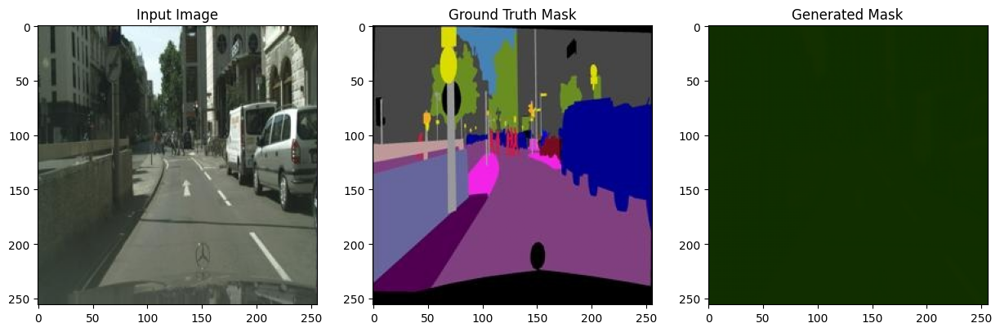

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14926083..0.19092926].


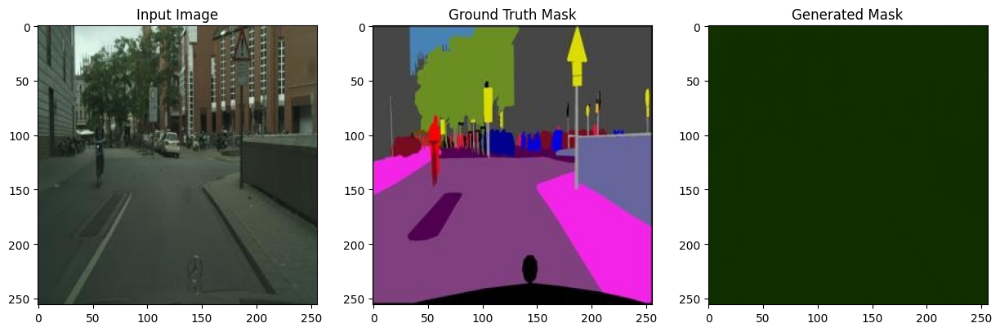

In [30]:
from UNET import UNet

device = "cuda:0" if torch.cuda.is_available() else "cpu"
device = torch.device(device)
print(device)

model = UNet(input_channel = 3).float().to(device)

lossfunc = nn.MSELoss() # Mean Square Error Loss
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
show_results(model, validation_loader, device, num_examples=2)

In [31]:
from tqdm import tqdm
import matplotlib.pyplot as plt


def train(model, train_loader, optimizer, lossfunc, device):
    model.train()
    train_loss = 0

    progress_bar = tqdm(train_loader, desc=f"Training Loss: {train_loss:.4f}", leave=False)
    for img, label in progress_bar:
        optimizer.zero_grad()
        img, label = img.to(device), label.to(device)
        output = model(img)
        loss = lossfunc(output, label)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

        progress_bar.set_description(f"Training Loss: {train_loss / len(progress_bar):.4f}")

    return train_loss / len(train_loader)


def valid(model, valid_loader, lossfunc, device):
    model.eval()
    val_loss = 0

    progress_bar = tqdm(valid_loader, desc=f"Validation Loss: {val_loss:.4f}", leave=False)

    with torch.no_grad():
        for img, label in progress_bar:
            img, label = img.to(device), label.to(device)
            output = model(img)
            loss = lossfunc(output, label)
            val_loss += loss.item()

            progress_bar.set_description(f"Validation Loss: {val_loss / len(progress_bar):.4f}")

    return val_loss / len(valid_loader)


def save_model_parameters(model, optimizer, epoch, filename):
    print(f"Saving the model parameters as : {filename}")
    checkpoint = {
        'epoch': epoch,
        'UNet_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

def load_model_parameters(filename, model, optimizer):
    if os.path.exists(filename):
        try:
            checkpoint = torch.load(filename)
            model.load_state_dict(checkpoint['UNet_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            epoch = checkpoint['epoch']
            print(f"Model parameters loaded successfully from epoch {epoch}. Resuming training...")
            return epoch + 1  # Return next epoch
        except Exception as e:
            print(f"Failed to load model parameters from {filename}. Error: {e}")
    else:
        print(f"Model parameters file {filename} not found. Training from scratch...")
    return 0 # Start training from epoch 0


### Entraînement du modèle 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14943522..0.19392645].


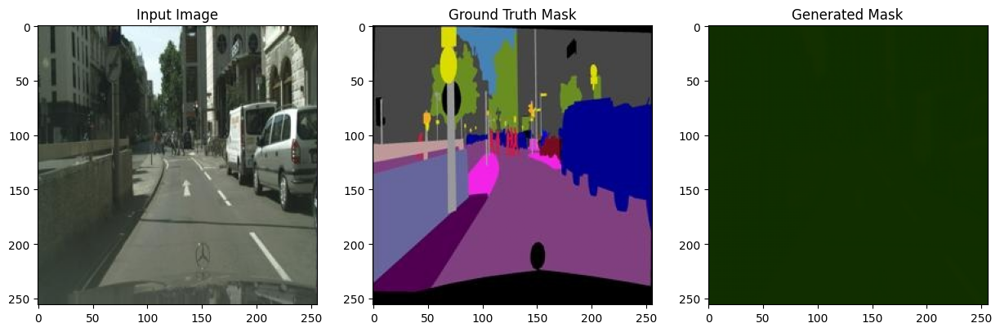

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14926083..0.19092926].


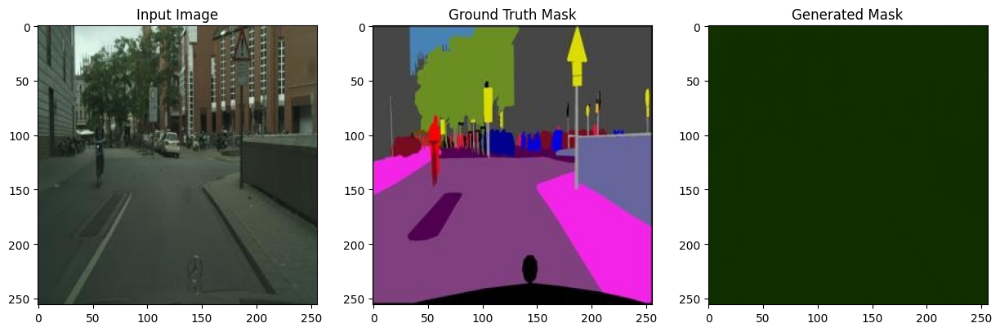

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1507953..0.19258489].


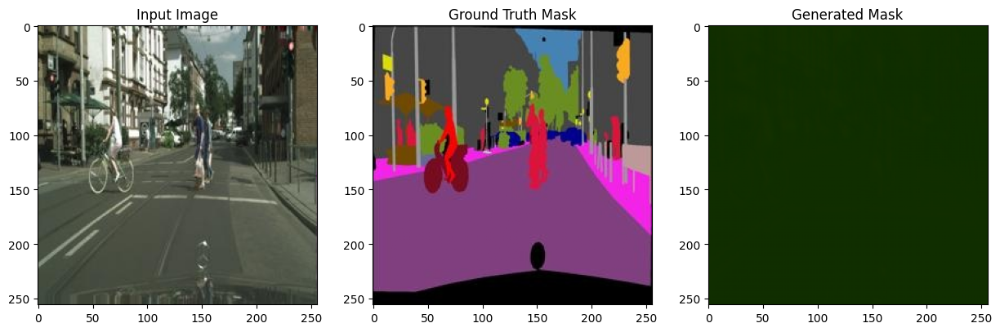

Saving the model parameters as : model_parameters.pt


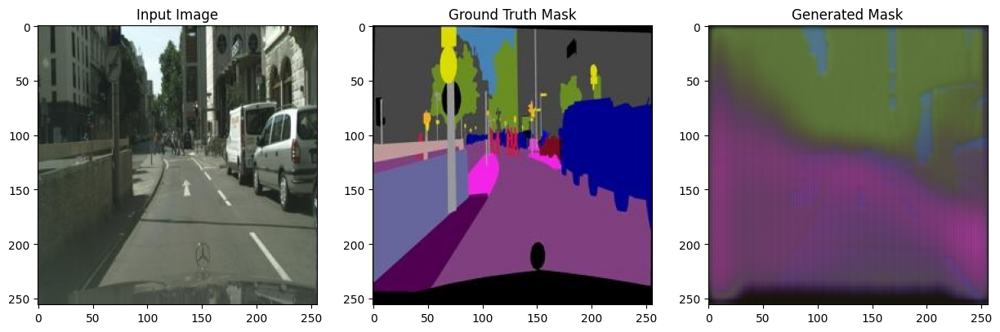

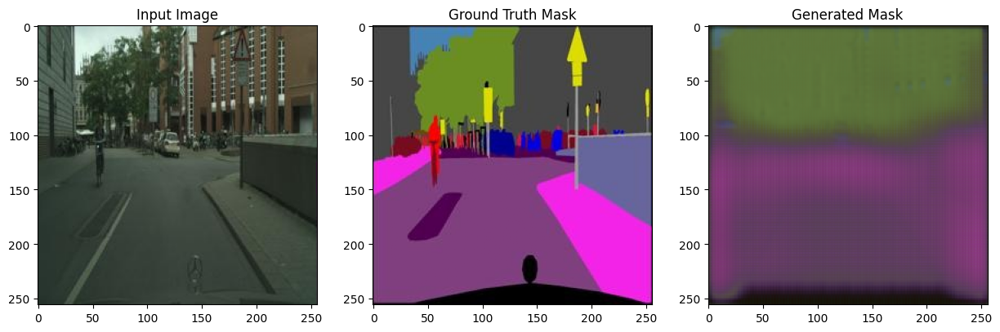

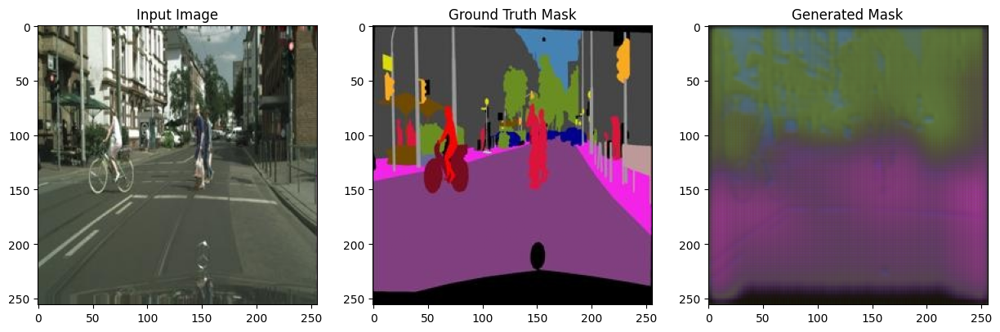

epoch : 0 ,train loss : 0.0417, valid loss : 0.0338


epoch : 1 ,train loss : 0.0297, valid loss : 0.0320


epoch : 2 ,train loss : 0.0264, valid loss : 0.0295


epoch : 3 ,train loss : 0.0234, valid loss : 0.0235


epoch : 4 ,train loss : 0.0219, valid loss : 0.0231


Saving the model parameters as : model_parameters.pt
epoch : 5 ,train loss : 0.0204, valid loss : 0.0237


epoch : 6 ,train loss : 0.0195, valid loss : 0.0199


epoch : 7 ,train loss : 0.0184, valid loss : 0.0222


epoch : 8 ,train loss : 0.0179, valid loss : 0.0217


epoch : 9 ,train loss : 0.0172, valid loss : 0.0180


Saving the model parameters as : model_parameters.pt


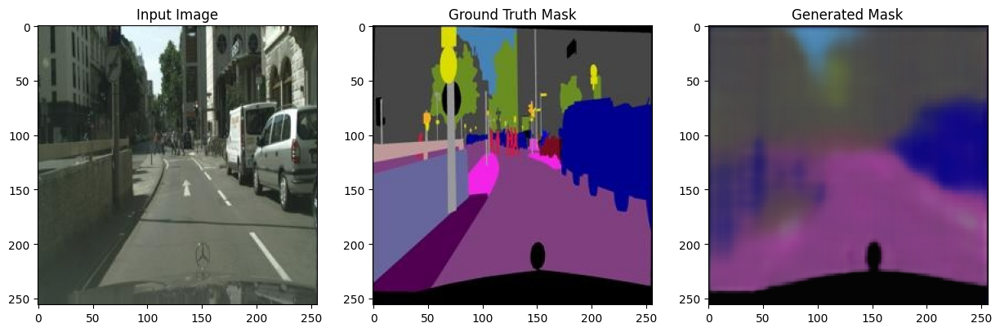

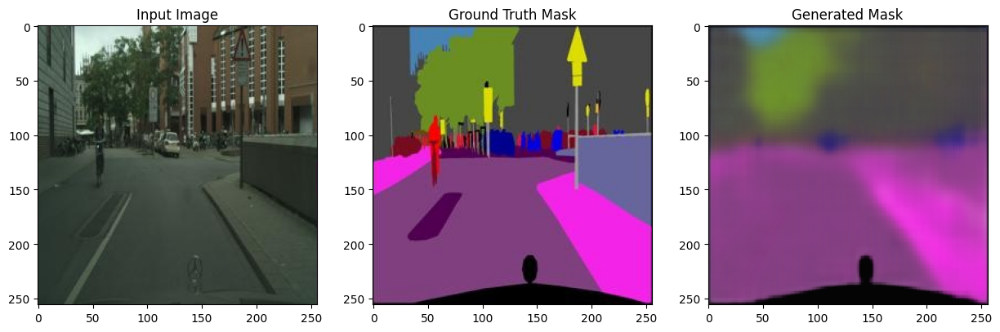

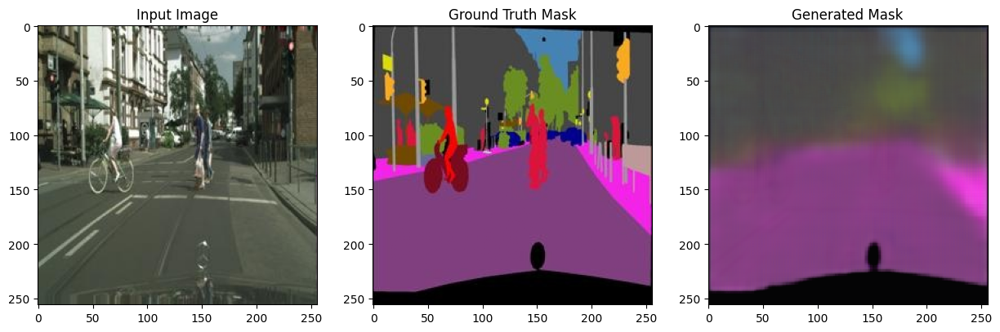

epoch : 10 ,train loss : 0.0167, valid loss : 0.0179


epoch : 11 ,train loss : 0.0163, valid loss : 0.0177


epoch : 12 ,train loss : 0.0159, valid loss : 0.0177


epoch : 13 ,train loss : 0.0156, valid loss : 0.0181


epoch : 14 ,train loss : 0.0153, valid loss : 0.0171


Saving the model parameters as : model_parameters.pt
epoch : 15 ,train loss : 0.0149, valid loss : 0.0166


epoch : 16 ,train loss : 0.0147, valid loss : 0.0161


epoch : 17 ,train loss : 0.0143, valid loss : 0.0153


epoch : 18 ,train loss : 0.0141, valid loss : 0.0174


epoch : 19 ,train loss : 0.0136, valid loss : 0.0156


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060632177..0.7442847].


Saving the model parameters as : model_parameters.pt


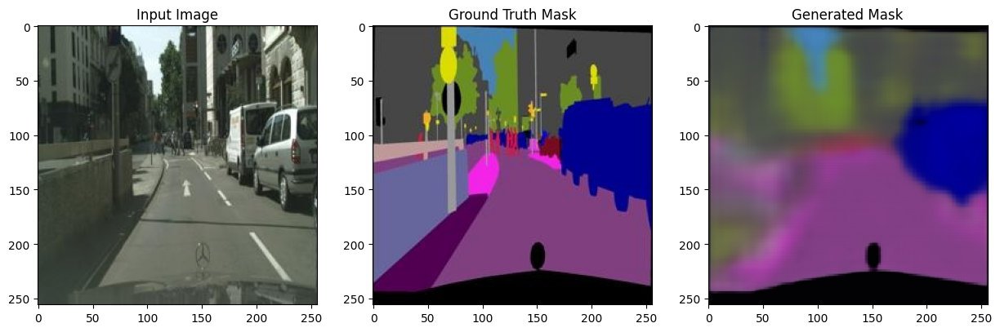

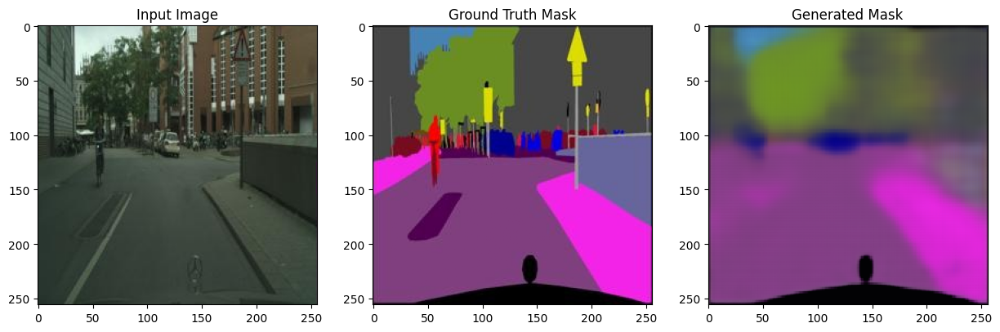

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.4991025e-05..0.9389977].


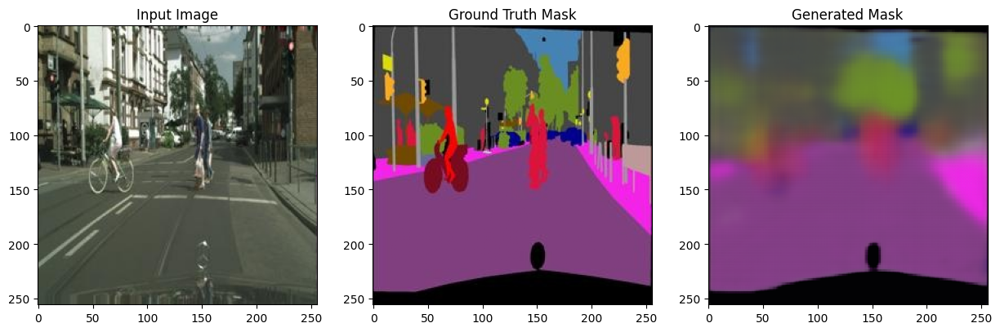

epoch : 20 ,train loss : 0.0135, valid loss : 0.0153


epoch : 21 ,train loss : 0.0132, valid loss : 0.0157


epoch : 22 ,train loss : 0.0120, valid loss : 0.0154


epoch : 23 ,train loss : 0.0116, valid loss : 0.0143


epoch : 24 ,train loss : 0.0112, valid loss : 0.0145


Saving the model parameters as : model_parameters.pt
epoch : 25 ,train loss : 0.0111, valid loss : 0.0148


epoch : 26 ,train loss : 0.0108, valid loss : 0.0145


epoch : 27 ,train loss : 0.0107, valid loss : 0.0147


epoch : 28 ,train loss : 0.0099, valid loss : 0.0141


epoch : 29 ,train loss : 0.0095, valid loss : 0.0148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013819975..0.98421925].


Saving the model parameters as : model_parameters.pt


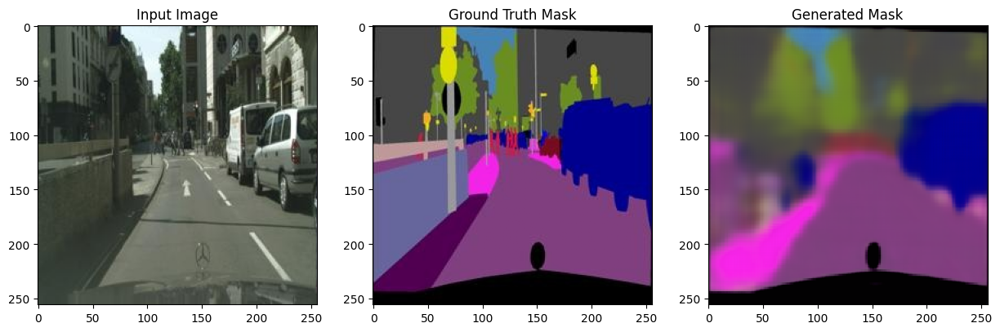

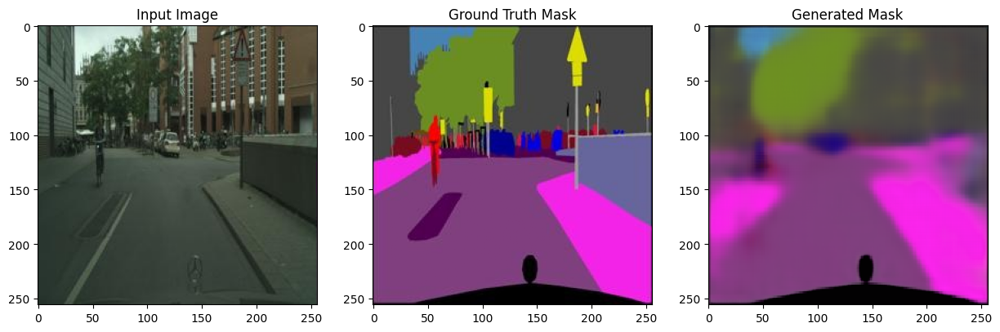

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0061120316..0.99191314].


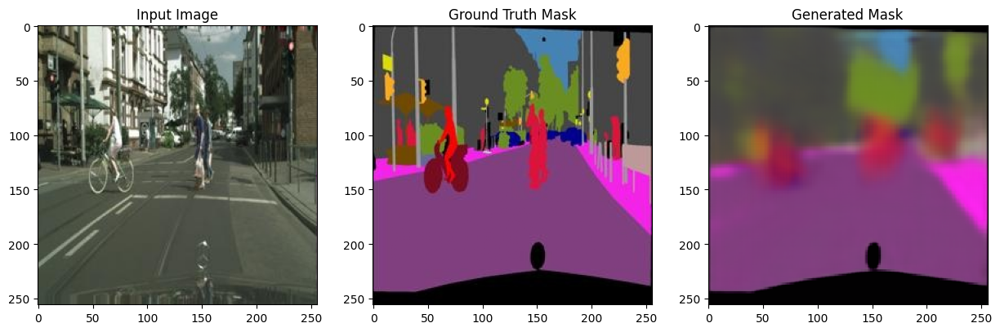

epoch : 30 ,train loss : 0.0093, valid loss : 0.0143


epoch : 31 ,train loss : 0.0092, valid loss : 0.0145


epoch : 32 ,train loss : 0.0091, valid loss : 0.0146


epoch : 33 ,train loss : 0.0086, valid loss : 0.0143


epoch : 34 ,train loss : 0.0085, valid loss : 0.0144


Saving the model parameters as : model_parameters.pt
epoch : 35 ,train loss : 0.0084, valid loss : 0.0144


epoch : 36 ,train loss : 0.0083, valid loss : 0.0145


epoch : 37 ,train loss : 0.0081, valid loss : 0.0145


epoch : 38 ,train loss : 0.0080, valid loss : 0.0144


epoch : 39 ,train loss : 0.0079, valid loss : 0.0146


Saving the model parameters as : model_parameters.pt


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03232769..0.9561879].


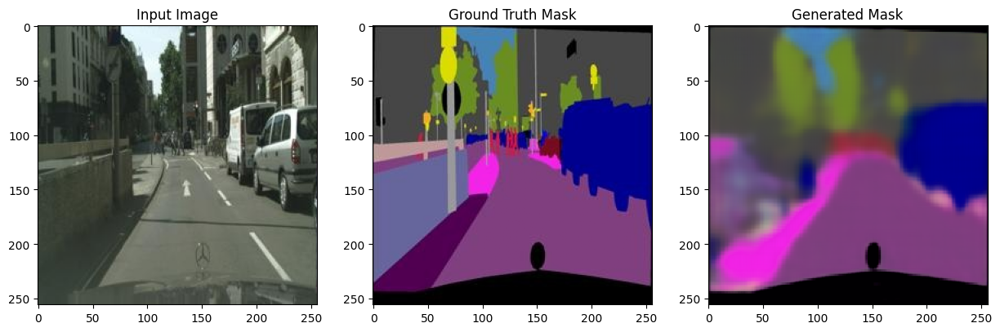

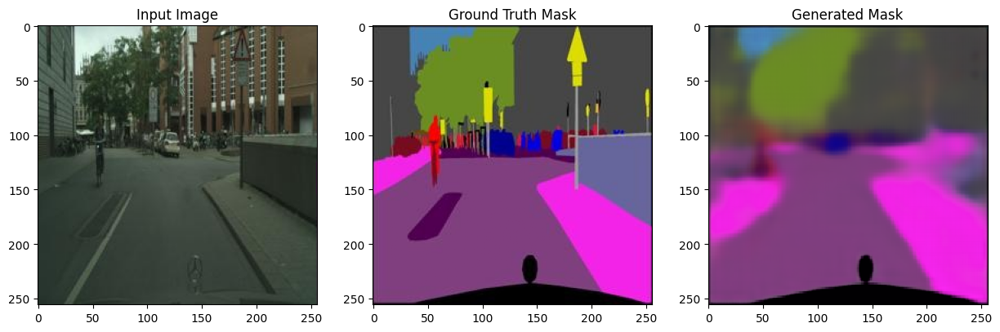

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015107192..0.9648779].


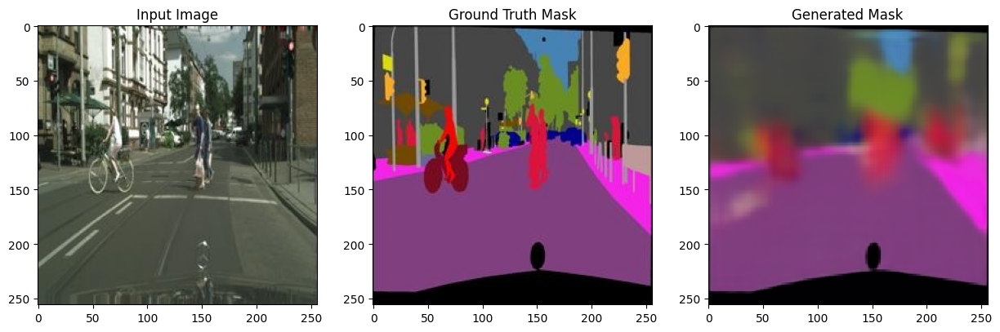

epoch : 40 ,train loss : 0.0079, valid loss : 0.0147


epoch : 41 ,train loss : 0.0078, valid loss : 0.0146


epoch : 42 ,train loss : 0.0077, valid loss : 0.0147


epoch : 43 ,train loss : 0.0077, valid loss : 0.0146


epoch : 44 ,train loss : 0.0077, valid loss : 0.0148


Saving the model parameters as : model_parameters.pt
epoch : 45 ,train loss : 0.0076, valid loss : 0.0147


epoch : 46 ,train loss : 0.0076, valid loss : 0.0147


epoch : 47 ,train loss : 0.0076, valid loss : 0.0147


epoch : 48 ,train loss : 0.0076, valid loss : 0.0147


epoch : 49 ,train loss : 0.0075, valid loss : 0.0147


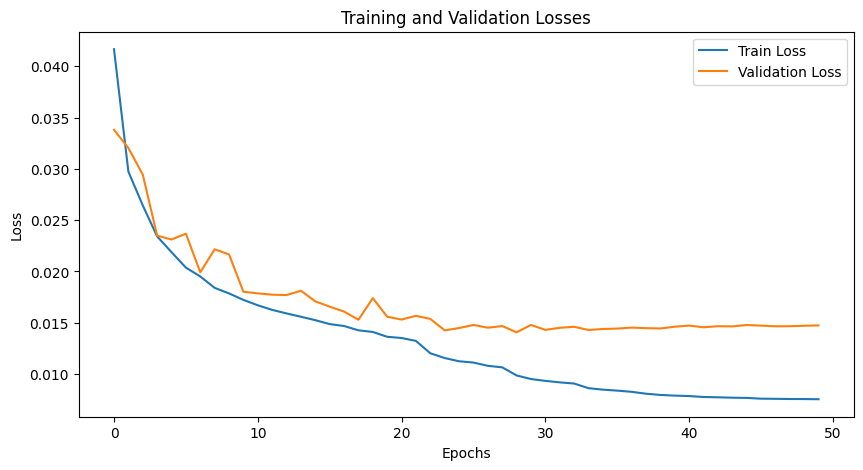

In [32]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Lists to store losses for plotting
train_losses = []
val_losses = []


if USE_SCHEDULER:
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

# Load model parameters before training
# start_epoch = load_model_parameters("model_parameters.pt", model, optimizer)
start_epoch=0
show_results(model, validation_loader, device, num_examples=3)

# Main loop
for i in range(start_epoch, EPOCHS):
    train_loss = train(model, training_loader, optimizer, lossfunc, device)
    val_loss = valid(model, validation_loader, lossfunc, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if USE_SCHEDULER:
        scheduler.step(val_loss)  # Update the learning rate based on validation loss

    # Save model parameters at desired intervals (e.g., every 5 epochs)
    if i % 5 == 0:
        save_model_parameters(model, optimizer, i, f"model_parameters.pt")

    # Show results at the end of each 5 epochs
    if i % 10 == 0:
        show_results(model, validation_loader, device, num_examples=3)

    print("epoch : {} ,train loss : {:.4f}, valid loss : {:.4f}".format(i, train_loss, val_loss))

# Plotting the losses
plt.figure(figsize=(10, 5))
plt.plot(range(start_epoch, EPOCHS), train_losses, label='Train Loss')
plt.plot(range(start_epoch, EPOCHS), val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Losses')
plt.show()

### Visualisation des résultats

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015987478..0.8287698].


Model parameters loaded successfully from epoch 45. Resuming training...


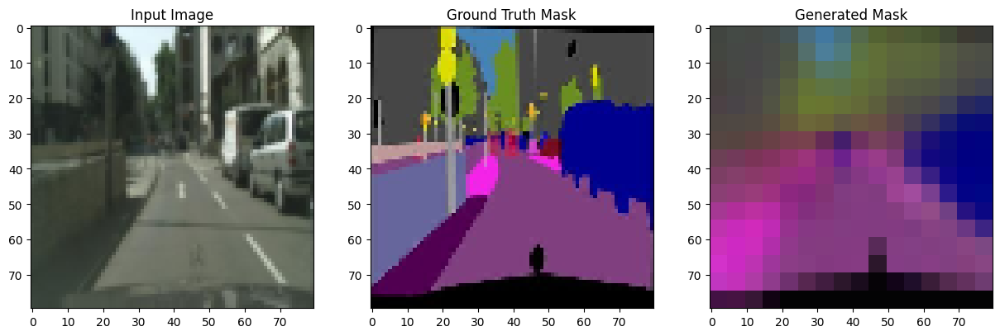

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011712884..1.016499].


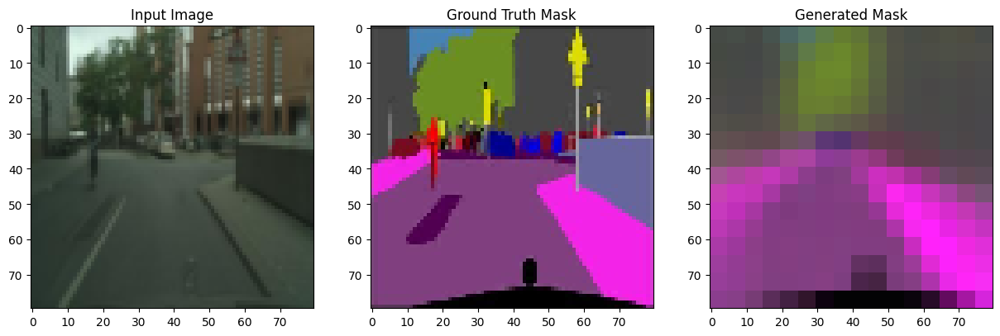

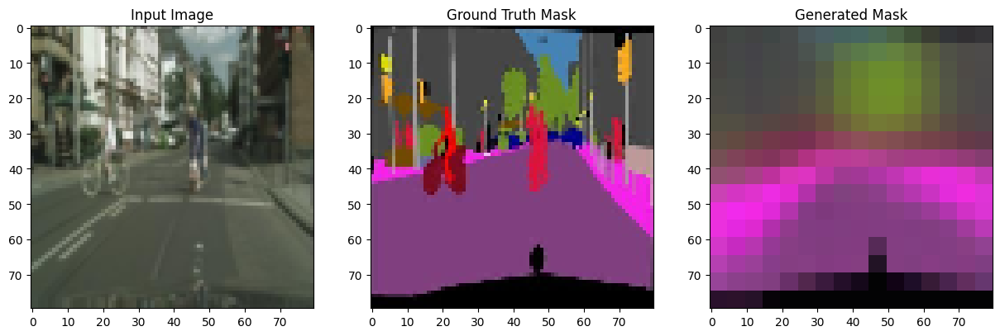

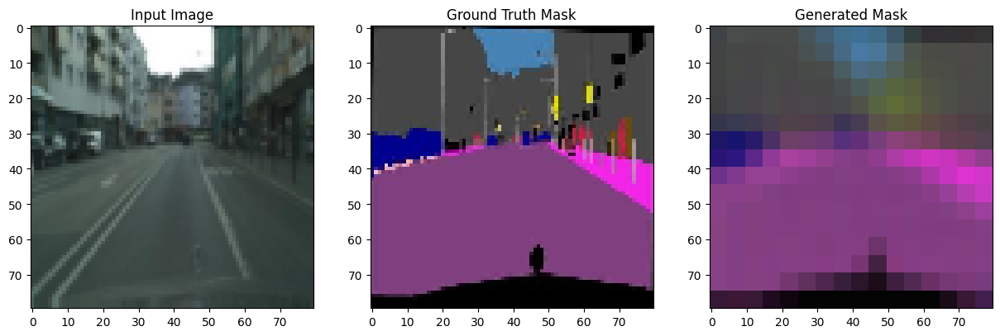

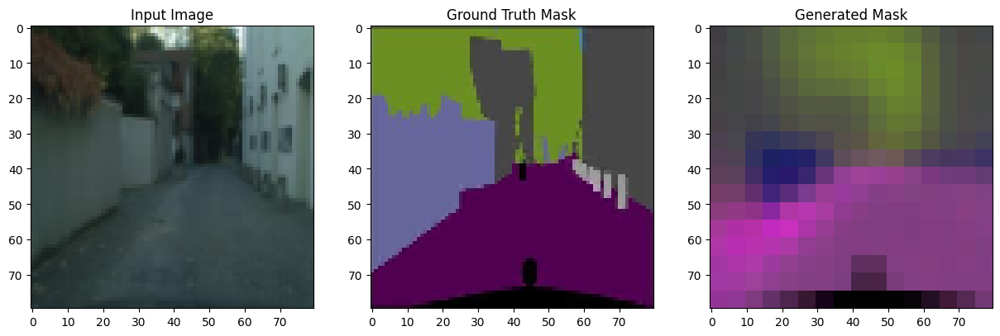

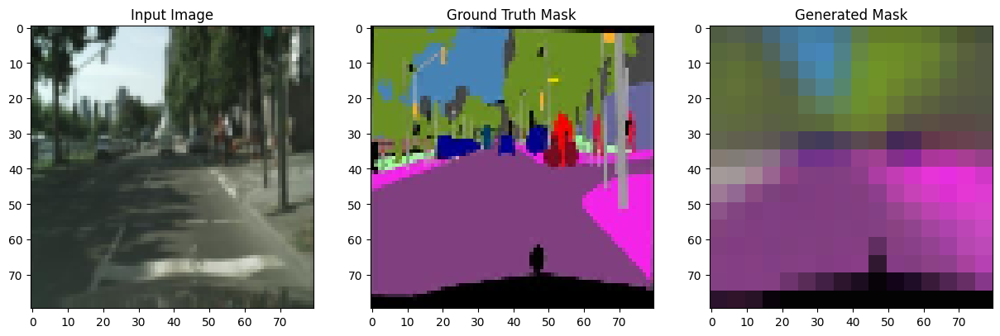

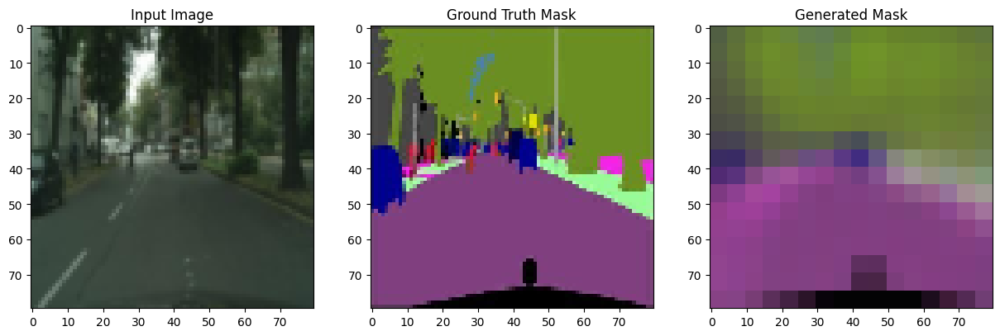

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0036548404..0.8500009].


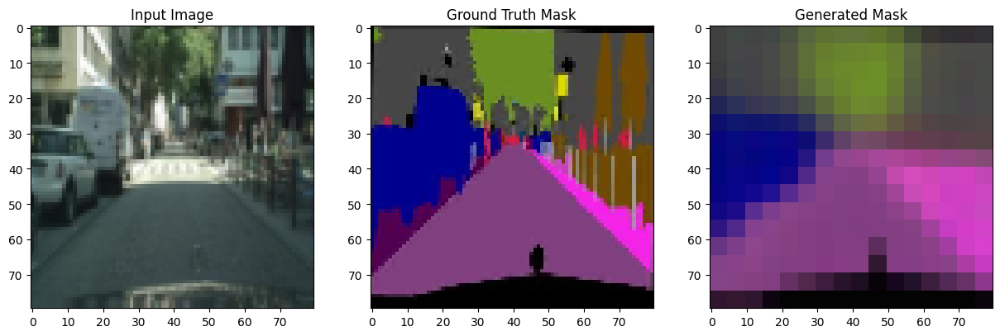

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.039024025..0.68539685].


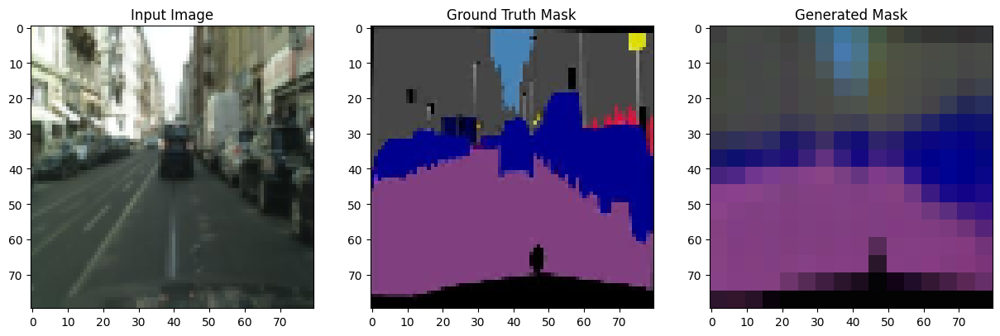

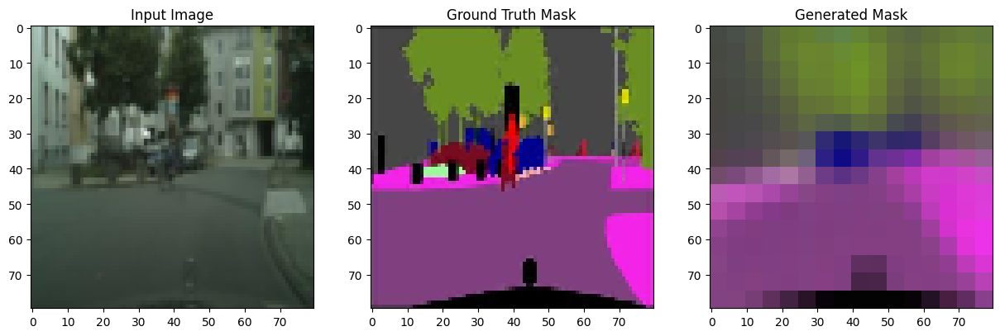

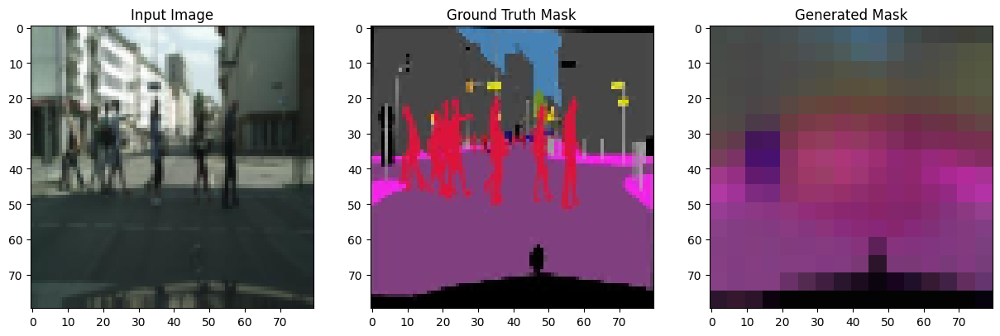

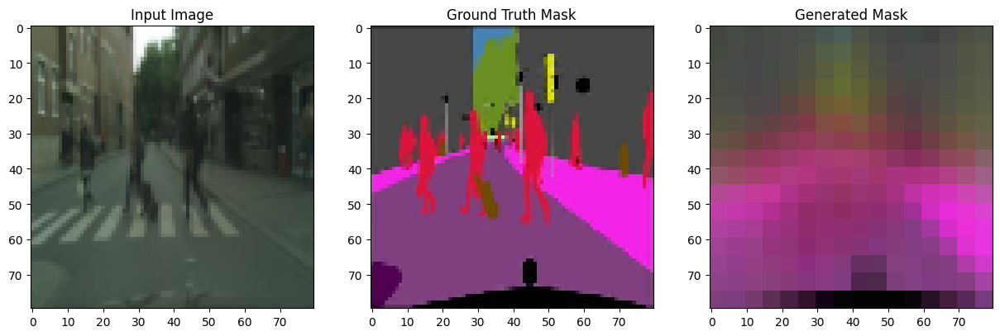

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012006454..1.0107305].


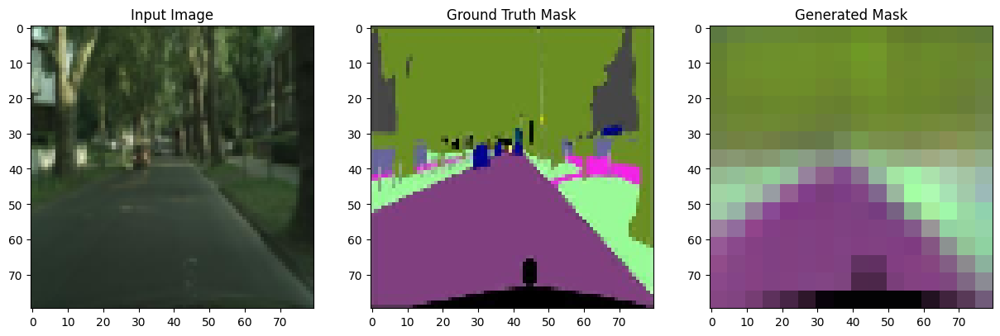

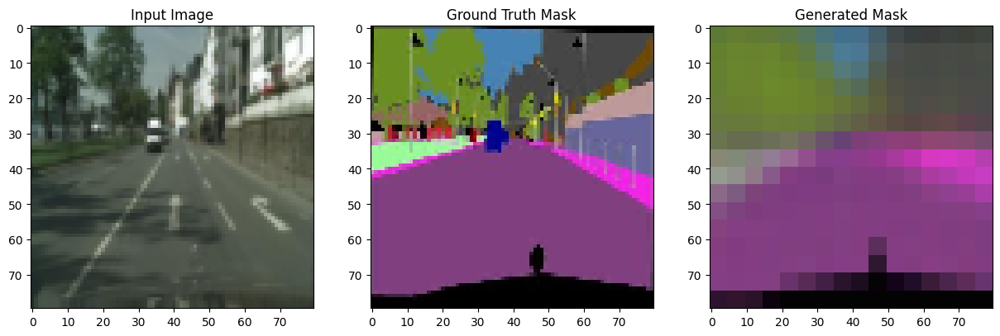

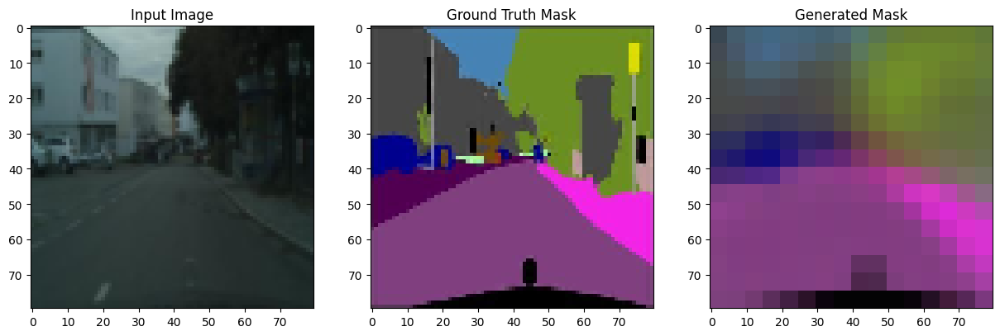

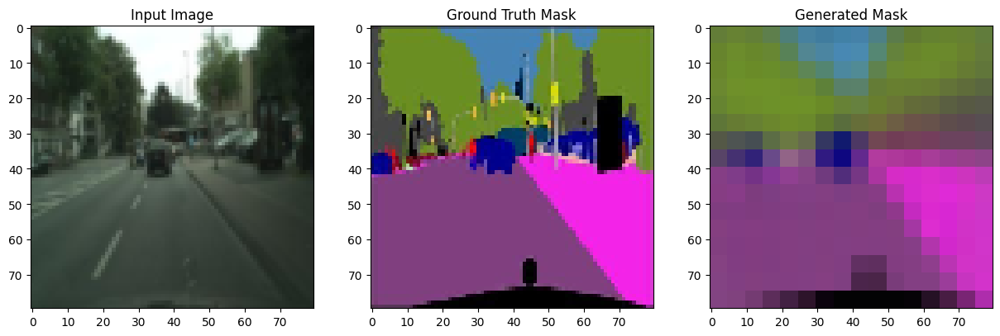

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02181597..0.67654115].


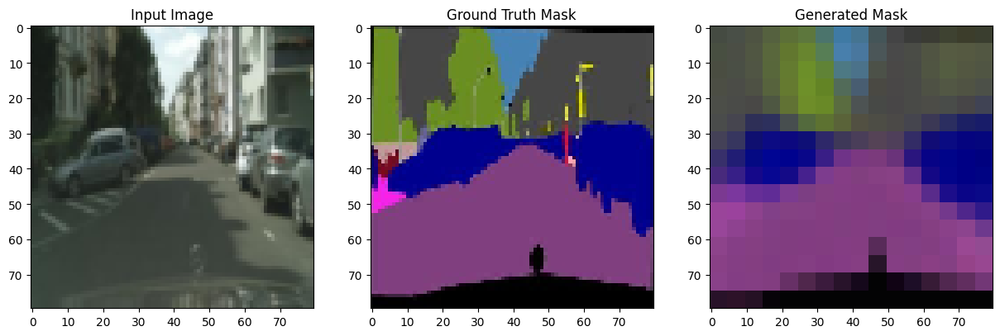

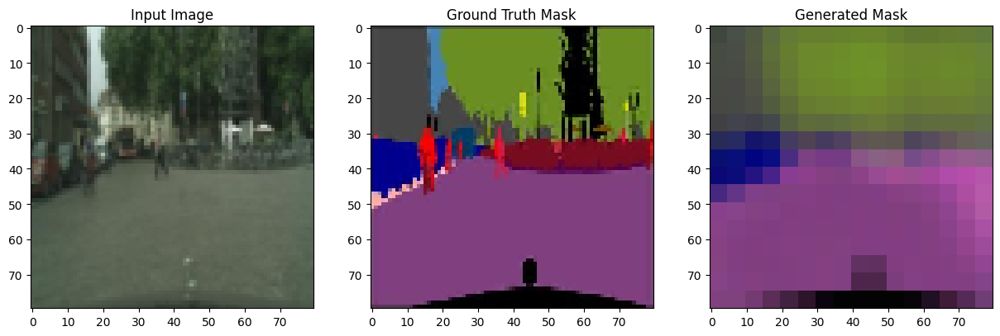

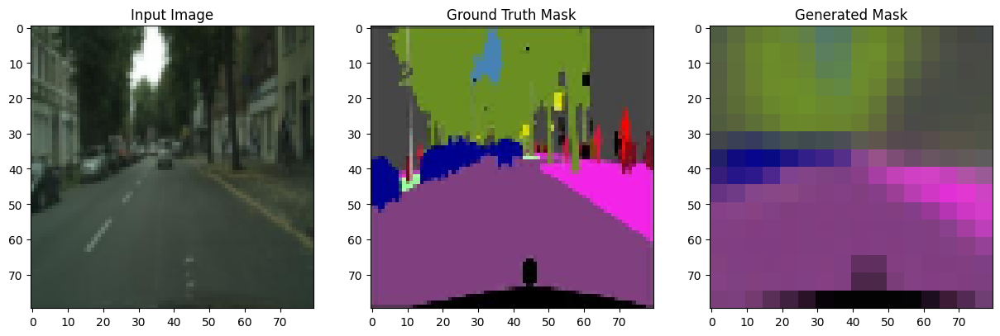

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042841755..0.70525885].


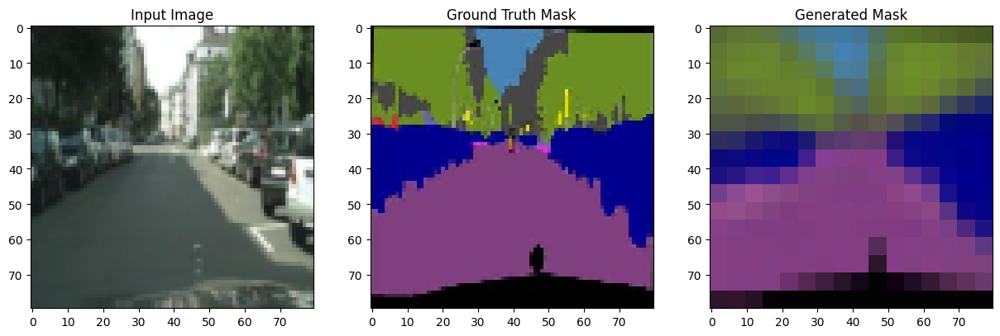

In [10]:
model = UNet(input_channel = 3).float().to(device)
_ = load_model_parameters("model_parameters.pt", model, optimizer)
show_results(model, validation_loader, device, num_examples=20)